# Lab 3: Visualizing Large Spatial Datasets

## Challenge 1

Below we define data description function which accepts only numerical columns and produces a dataframe with mean and count for each numerical column.

This function initaializes an empty list and filters only numerical columns. In a for loop, it iterates over these columns and calculates mean and count for each column and appends it to the list. Finally, it converts the list into a dataframe.

In [13]:
# Function which accepts only numerical values and calculates mean and count
def data_description(df):
    
    # Initialize an empty list
    stats = []
    subset = df.select_dtypes(include='float64')

    # Iterate over columns of the dataframe and calculate mean and count
    for column in subset.columns:
        stats_dict = {'Mean': subset[column].mean(), 'Count': len(subset[column])}
        stats.append(stats_dict)

    # Convert into a DataFrame
    stats_df = pd.DataFrame(stats, index=subset.columns)
    return stats_df

## Challenge 2

### Is greater density of Airbnbs associated with higher house prices in London?

In this challenge, we will be exploring locations of Airbnb listings and average house prices in London boroughs. The concern that increasing number of flats being rented as Airbnbs has negative effects on local housing market has been raised by many. Growing popularity of Airbnbs is believed to contribute to drive housing prices in urban centres and popular tourist locations up. Consequently, making housing unaffordable to local citizens. Here, we present some descriptive analysis of whether this might be the case in London.

We utilize the following datasets: listings of Airbnb locations in London (http://insideairbnb.com/get-the-data/), house prices data by borough (https://data.london.gov.uk/dataset/average-house-prices) and spatial data on London boroughs (available as separate file on Airbnb website togetherf with listings). All of these datasets are easily available online as downloadable files in csv format, so we don't have to use API/web services.

The analysis will proceed as follows: (1) we import and clean the data, and perform necessary merges and joins, (2) next, we explore the data and present some summary statistics, (3) univariate visualizations and (4) finally, we visually explore the relationship between Airbnb listings locations, their prices and average housing prices across London borough.


### 1 Import and clean data

#### 1.1 Airbnb Listings in London

As the first step, we import and clean the data on Airbnb listings in London available through the link available above. We only keep relevant columns, handle special characters and missing values and finally, use values on latitude and longitude to convert the dataset into a geopandas dataframe.

In [1]:
import pandas as pd

# import downloaded data for airbnb listings in London
listings_ldn = pd.read_csv("Lab3_Data/listings_ldn.csv")

# check column headings
listings_ldn.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'number_of_reviews_ltm', 'license'],
      dtype='object')

In [17]:
# Subset data
subset_listings_ldn = listings_ldn[['id', 
                            'neighbourhood',
                            'latitude',
                            'longitude',
                            'room_type',
                            'price',
                            'number_of_reviews']]

# clean data to remove some characters
subset_listings_ldn.loc[subset_listings_ldn.index, 'price'] = subset_listings_ldn['price'].replace('[\$,]', '', regex=True).astype(float)

# Remove observations with missing values
subset_listings_ldn = subset_listings_ldn.dropna()
subset_listings_ldn.head()

,id,neighbourhood,latitude,longitude,room_type,price,number_of_reviews
0,34935,Tower Hamlets,51.523670,-0.068886,Entire home/apt,151.0,122
1,198258,Barking and Dagenham,51.534300,0.081780,Private room,67.0,41
2,228389,Croydon,51.366460,-0.121180,Private room,50.0,0
3,229684,Lewisham,51.487930,-0.042040,Private room,30.0,22
5,232240,Hammersmith and Fulham,51.498572,-0.219898,Entire home/apt,200.0,35


In [19]:
# Convert into a geometry dataframe
import geopandas as gpd

# create a geometry column based on latitude and longitude
listings_ldn_gdf = gpd.GeoDataFrame(subset_listings_ldn, 
                                   geometry=gpd.points_from_xy(subset_listings_ldn['longitude'], 
                                                               subset_listings_ldn['latitude']),
                                   crs = 'EPSG:4326')
# Keep only relevant columns
listings_ldn_gdf = listings_ldn_gdf[['id', 'neighbourhood', 'room_type', 'price', 'geometry', 'number_of_reviews']]
listings_ldn_gdf = listings_ldn_gdf.rename(columns={'neighbourhood':'Area'})

In [20]:
# Check crs
print(listings_ldn_gdf.crs)

EPSG:4326


In [21]:
subset_listings_ldn['neighbourhood'].unique()

array(['Tower Hamlets', 'Barking and Dagenham', 'Croydon', 'Lewisham',
       'Hammersmith and Fulham', 'Kensington and Chelsea', 'Wandsworth',
       'Hackney', 'Southwark', 'Newham', 'Camden', 'Ealing', 'Barnet',
       'Richmond upon Thames', 'Islington', 'Enfield', 'Brent',
       'Haringey', 'Waltham Forest', 'Lambeth', 'Westminster', 'Merton',
       'Redbridge', 'Sutton', 'Havering', 'Bromley', 'Greenwich',
       'Hounslow', 'Bexley', 'Kingston upon Thames', 'Harrow',
       'City of London', 'Hillingdon'], dtype=object)

#### 1.2 Neighbourhood geometry

Since data on house prices are available on the level of neighbourhoods (boroughs), we need a dataset which includes boundaries of of these neighbourhoods. Such dataset is available on the Airbnb website alongside listings (the same link as provided above).

In [23]:
# get geometry for neighbourhoods

# Import and read geojson file
neighbourhoods = gpd.read_file("Lab3_Data/neighbourhoods.geojson", driver="GeoJSON")
neighbourhoods = neighbourhoods[['neighbourhood', 'geometry']]

# Rename neighbourhood column: for merges and joins
neighbourhoods = neighbourhoods.rename(columns={'neighbourhood':'Area'})

neighbourhoods.head()

,Area,geometry
0,Kingston upon Thames,"MULTIPOLYGON (((-0.33066 51.32901, -0.33057 51..."
1,Croydon,"MULTIPOLYGON (((-0.06399 51.31864, -0.06405 51..."
2,Bromley,"MULTIPOLYGON (((0.01216 51.29960, 0.01199 51.2..."
3,Hounslow,"MULTIPOLYGON (((-0.24454 51.48870, -0.24466 51..."
4,Ealing,"MULTIPOLYGON (((-0.41181 51.53408, -0.41186 51..."


#### 1.3 House Prices

The last dataset we need contains information on average house prices by boroughs over several years measured by mean and median. The dataset can be downloaded using the link below. Since this dataset does not contain a geometry column, we merge it with boroughs dataset obtained above.

In [24]:
house_prices = pd.read_csv("https://data.london.gov.uk/download/average-house-prices/b1b0079e-698c-4c0b-b8c7-aa6189590ca4/land-registry-house-prices-borough.csv")

#Show column headings
house_prices['Area'].unique()

array(['City of London', 'Barking and Dagenham', 'Barnet', 'Bexley',
       'Brent', 'Bromley', 'Camden', 'Croydon', 'Ealing', 'Enfield',
       'Greenwich', 'Hackney', 'Hammersmith and Fulham', 'Haringey',
       'Harrow', 'Havering', 'Hillingdon', 'Hounslow', 'Islington',
       'Kensington and Chelsea', 'Kingston upon Thames', 'Lambeth',
       'Lewisham', 'Merton', 'Newham', 'Redbridge',
       'Richmond upon Thames', 'Southwark', 'Sutton', 'Tower Hamlets',
       'Waltham Forest', 'Wandsworth', 'Westminster', 'North East',
       'North West', 'Yorkshire And The Humber', 'East Midlands',
       'West Midlands', 'East of England', 'London', 'South East',
       'South West', 'England', 'Wales', 'England And Wales'],
      dtype=object)

In [25]:
# Keep only house prices in London
areas_ldn = ['City of London', 'Barking and Dagenham', 'Barnet', 'Bexley',
       'Brent', 'Bromley', 'Camden', 'Croydon', 'Ealing', 'Enfield',
       'Greenwich', 'Hackney', 'Hammersmith and Fulham', 'Haringey',
       'Harrow', 'Havering', 'Hillingdon', 'Hounslow', 'Islington',
       'Kensington and Chelsea', 'Kingston upon Thames', 'Lambeth',
       'Lewisham', 'Merton', 'Newham', 'Redbridge',
       'Richmond upon Thames', 'Southwark', 'Sutton', 'Tower Hamlets',
       'Waltham Forest', 'Wandsworth', 'Westminster']

# Filter only London areas
house_prices_ldn = house_prices[house_prices['Area'].isin(areas_ldn)]

# Keep only most recent data
house_prices_ldn = house_prices[house_prices['Year'] == 'Year ending Dec 2017']
house_prices_ldn.head()

,Code,Area,Year,Measure,Value
3960,E09000001,City of London,Year ending Dec 2017,Median,"835,000"
3961,E09000002,Barking and Dagenham,Year ending Dec 2017,Median,"300,000"
3962,E09000003,Barnet,Year ending Dec 2017,Median,"533,500"
3963,E09000004,Bexley,Year ending Dec 2017,Median,"342,500"
3964,E09000005,Brent,Year ending Dec 2017,Median,"499,950"


In [26]:
# Convert values on house prices into float
house_prices_ldn['Value'] = house_prices_ldn['Value'].replace(',', '', regex=True).astype(float)
house_prices_ldn.dtypes

/var/folders/_v/0ysnzh811hj_hnrpjkv8j6fw0000gn/T/ipykernel_90285/2237584522.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  house_prices_ldn['Value'] = house_prices_ldn['Value'].replace(',', '', regex=True).astype(float)


Code        object
Area        object
Year        object
Measure     object
Value      float64
dtype: object

In [27]:
# Merge house prices data with spatial data on neighbourhoods 
house_prices_geo = pd.merge(house_prices_ldn, neighbourhoods, on="Area")

# Check for missing values
missing = house_prices_geo.isna().sum()
print(missing)

house_prices_geo.head()

Code        0
Area        0
Year        0
Measure     0
Value       0
geometry    0
dtype: int64


,Code,Area,Year,Measure,Value,geometry
0,E09000001,City of London,Year ending Dec 2017,Median,835000.0,"MULTIPOLYGON (((-0.11155 51.51076, -0.11156 51..."
1,E09000002,Barking and Dagenham,Year ending Dec 2017,Median,300000.0,"MULTIPOLYGON (((0.07319 51.52937, 0.07319 51.5..."
2,E09000003,Barnet,Year ending Dec 2017,Median,533500.0,"MULTIPOLYGON (((-0.19987 51.67017, -0.19968 51..."
3,E09000004,Bexley,Year ending Dec 2017,Median,342500.0,"MULTIPOLYGON (((0.12024 51.51145, 0.12162 51.5..."
4,E09000005,Brent,Year ending Dec 2017,Median,499950.0,"MULTIPOLYGON (((-0.19654 51.52766, -0.19682 51..."


#### 1.4 Putting it all together: Spatial join

Finally, we combine all datasets above using a spatial join which then allows us to explore number of listings by boroughs and examine their relationship with house prices on the same spatial level.

In [ ]:
# Convert into geodataframe
house_prices_gdf = gpd.GeoDataFrame(house_prices_geo, geometry='geometry') 

# keep only mean house price per neighbourhood 
house_prices_gdf = house_prices_gdf[house_prices_gdf['Measure'] == 'Mean']
print(house_prices_gdf.crs)
house_prices_gdf.explore()

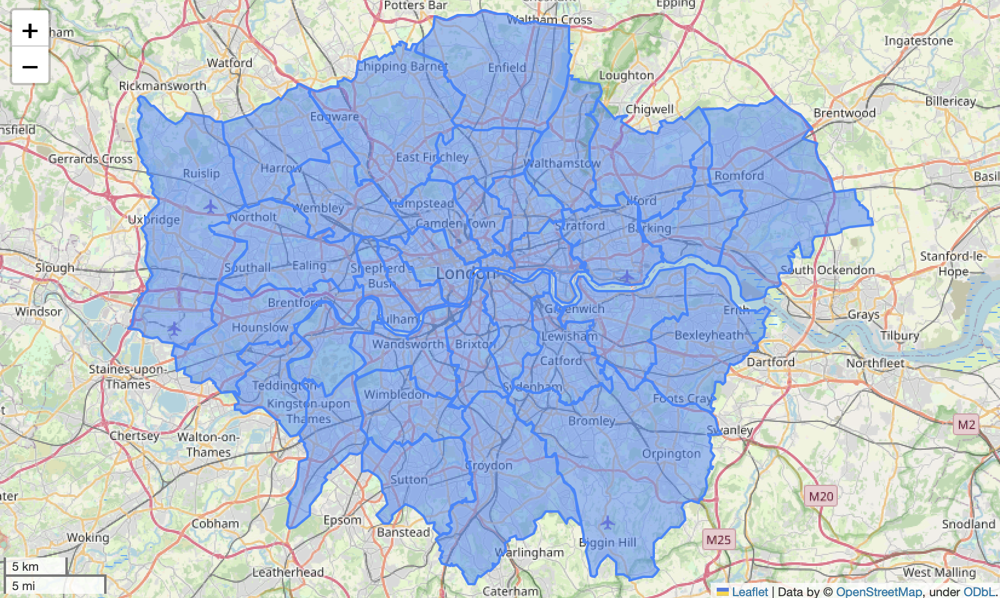

In [29]:
# check geometry types
print(listings_ldn_gdf['geometry'].geom_type)
print(house_prices_gdf['geometry'].geom_type)

0        Point
1        Point
2        Point
3        Point
5        Point
         ...  
91772    Point
91774    Point
91775    Point
91776    Point
91777    Point
Length: 87598, dtype: object
33    MultiPolygon
34    MultiPolygon
35    MultiPolygon
36    MultiPolygon
37    MultiPolygon
38    MultiPolygon
39    MultiPolygon
40    MultiPolygon
41    MultiPolygon
42    MultiPolygon
43    MultiPolygon
44    MultiPolygon
45    MultiPolygon
46    MultiPolygon
47    MultiPolygon
48    MultiPolygon
49    MultiPolygon
50    MultiPolygon
51    MultiPolygon
52    MultiPolygon
53    MultiPolygon
54    MultiPolygon
55    MultiPolygon
56    MultiPolygon
57    MultiPolygon
58    MultiPolygon
59    MultiPolygon
60    MultiPolygon
61    MultiPolygon
62    MultiPolygon
63    MultiPolygon
64    MultiPolygon
65    MultiPolygon
dtype: object


In [30]:
# Check coordinate systems
print(listings_ldn_gdf.crs)
print(house_prices_gdf.crs)

EPSG:4326
EPSG:4326


In [31]:
# Spatial join: airbnb locations and house prices by neighbourhood in London
airbnb_house_prices = gpd.sjoin(listings_ldn_gdf, house_prices_gdf, how='inner') 
airbnb_house_prices.head()

,id,Area_left,room_type,price,geometry,number_of_reviews,index_right,Code,Area_right,Year,Measure,Value
0,34935,Tower Hamlets,Entire home/apt,151.0,POINT (-0.06889 51.52367),122,62,E09000030,Tower Hamlets,Year ending Dec 2017,Mean,554009.0
1,198258,Barking and Dagenham,Private room,67.0,POINT (0.08178 51.53430),41,34,E09000002,Barking and Dagenham,Year ending Dec 2017,Mean,301518.0
2,228389,Croydon,Private room,50.0,POINT (-0.12118 51.36646),0,40,E09000008,Croydon,Year ending Dec 2017,Mean,399645.0
3,229684,Lewisham,Private room,30.0,POINT (-0.04204 51.48793),22,55,E09000023,Lewisham,Year ending Dec 2017,Mean,475142.0
5,232240,Hammersmith and Fulham,Entire home/apt,200.0,POINT (-0.21990 51.49857),35,45,E09000013,Hammersmith and Fulham,Year ending Dec 2017,Mean,972231.0


In [32]:
airbnb_house_prices.columns
airbnb_house_prices.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 87598 entries, 0 to 91777
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   id                 87598 non-null  int64   
 1   Area_left          87598 non-null  object  
 2   room_type          87598 non-null  object  
 3   price              87598 non-null  float64 
 4   geometry           87598 non-null  geometry
 5   number_of_reviews  87598 non-null  int64   
 6   index_right        87598 non-null  int64   
 7   Code               87598 non-null  object  
 8   Area_right         87598 non-null  object  
 9   Year               87598 non-null  object  
 10  Measure            87598 non-null  object  
 11  Value              87598 non-null  float64 
dtypes: float64(2), geometry(1), int64(3), object(6)
memory usage: 8.7+ MB


In [33]:
# Drop unnecessary columns
cols_to_drop = ['Area_left', 'index_right', 'Year', 'Measure']
airbnb_house_prices = airbnb_house_prices.drop(cols_to_drop, axis=1)

In [34]:
# Rename columns
airbnb_house_prices = airbnb_house_prices.rename(
    columns={'price':'Airbnb_price', 'Value':'House_prices', 'Area_right':'Area'})

### 2 Summary statistics and exploratory data analysis

In this section, we present some descriptive statistics including counts, averages, number of Airbnb listings bz neighbourhood and average Airbnb prices by neighbourhood. 

We focus on three key variables: average house prices, number of Airbnb listings per neighbourhood and average Airbnb price per neighbourhood. Sorting the resulting tables based on these variables suggests that prices and number of listings are the highest in roughly same neighbourhoods, including Westminster, Kensington, City of London and Camden.

In [35]:
# Generate descriptive statistics
airbnb_house_prices['House_prices'] = airbnb_house_prices['House_prices'].replace(',', '', regex=True).astype(float)

# generate descriptive statistics
descriptive_stats = airbnb_house_prices[['Airbnb_price', 'number_of_reviews', 'House_prices']].describe()
descriptive_stats

,Airbnb_price,number_of_reviews,House_prices
count,87598.000000,87598.000000,8.759800e+04
mean,182.141773,18.678646,8.747198e+05
std,394.013315,44.109987,4.981587e+05
min,1.000000,0.000000,3.015180e+05
25%,65.000000,1.000000,5.540090e+05
50%,115.000000,4.000000,6.412100e+05
75%,196.000000,17.000000,9.722310e+05
max,53588.000000,1608.000000,2.092485e+06


In [36]:
# frequency table of Airbnb listings across neighbourhoods
neighborhood_counts = airbnb_house_prices['Area'].value_counts()
neighborhood_counts

Area
Westminster               9955
Tower Hamlets             6945
Hackney                   6067
Kensington and Chelsea    5817
Camden                    5724
Southwark                 4950
Lambeth                   4723
Islington                 4639
Wandsworth                4471
Hammersmith and Fulham    3781
Brent                     2787
Lewisham                  2588
Haringey                  2379
Newham                    2275
Barnet                    2251
Ealing                    2171
Greenwich                 1919
Waltham Forest            1725
Croydon                   1509
Merton                    1437
Hounslow                  1270
Richmond upon Thames      1243
Hillingdon                 864
Redbridge                  861
Enfield                    815
Bromley                    773
Kingston upon Thames       694
Barking and Dagenham       611
City of London             565
Bexley                     519
Harrow                     499
Havering                   398
Sut

In [37]:
# calculate average price
price_by_area = airbnb_house_prices.groupby('Area')['Airbnb_price'].mean().reset_index()
price_by_area.columns = ['Area', 'Airbnb_price']

# Create a DataFrame with counts by area
count_by_area = airbnb_house_prices.groupby('Area').size().reset_index(name='Num_listings')
count_by_area.columns = ['Area', 'Num_listings']

# Merge the two DataFrames on the 'Area' column
by_area = pd.merge(price_by_area, count_by_area, on='Area')

# Sort the DataFrame by 'Airbnb_price' in descending order
by_area_sorted = by_area.sort_values(by='Airbnb_price', ascending=False)

# Display the resulting DataFrame
by_area_sorted

,Area,Airbnb_price,Num_listings
32,Westminster,332.932798,9955
19,Kensington and Chelsea,316.591026,5817
6,City of London,233.155752,565
5,Camden,206.244584,5724
12,Hammersmith and Fulham,186.562814,3781
31,Wandsworth,174.481995,4471
26,Richmond upon Thames,170.346742,1243
27,Southwark,169.906869,4950
18,Islington,166.761587,4639
1,Barnet,164.580187,2251


In [38]:
# Merge with geopandas dataframe of houseprices by neighbourhood
airbnb_merged = pd.merge(by_area, house_prices_gdf, on='Area')
airbnb_merged['Value'] = airbnb_merged['Value'].replace(',', '', regex=True).astype(float)
airbnb_merged['Value'] = airbnb_merged['Value'].astype(float)

# Sort by house prices: Are house prices are highest in the neighbourhoods where also Aibnbs concentrate?
airbnb_sorted = airbnb_merged.sort_values(by='Value', ascending=False)

airbnb_sorted.head()            

,Area,Airbnb_price,Num_listings,Code,Year,Measure,Value,geometry
19,Kensington and Chelsea,316.591026,5817,E09000020,Year ending Dec 2017,Mean,2092485.0,"MULTIPOLYGON (((-0.18386 51.47742, -0.18401 51..."
32,Westminster,332.932798,9955,E09000033,Year ending Dec 2017,Mean,1718124.0,"MULTIPOLYGON (((-0.14998 51.48548, -0.15006 51..."
5,Camden,206.244584,5724,E09000007,Year ending Dec 2017,Mean,1099876.0,"MULTIPOLYGON (((-0.14239 51.56912, -0.14247 51..."
12,Hammersmith and Fulham,186.562814,3781,E09000013,Year ending Dec 2017,Mean,972231.0,"MULTIPOLYGON (((-0.24454 51.48870, -0.24458 51..."
6,City of London,233.155752,565,E09000001,Year ending Dec 2017,Mean,950760.0,"MULTIPOLYGON (((-0.11155 51.51076, -0.11156 51..."


### 3 Univariate visualizations

In this section, we present a series of visualizations. We visualize distribution of house and Airbnb prices which appear to have relatively similar shape. We use interactive map to visualize locations of Airbnb and a chloropleth map to visualize average house prices.

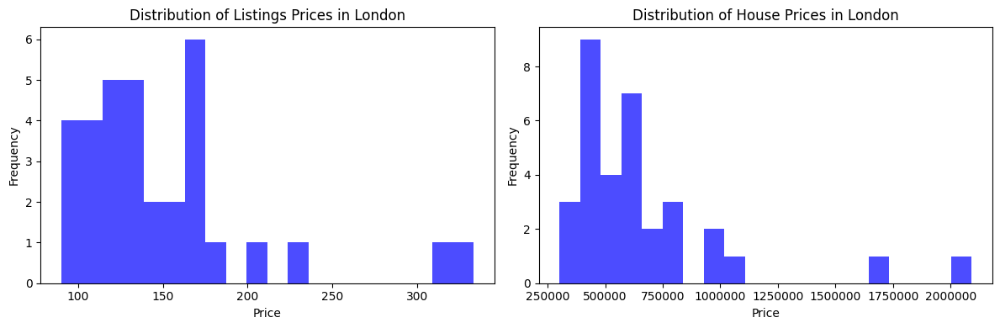

In [39]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Plot a histogram of the 'price' attribute
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Plot histogram 1
axes[0].hist(airbnb_merged['Airbnb_price'], bins=20, color='blue', alpha=0.7)
axes[0].set_title('Distribution of Listings Prices in London')
axes[0].set_xlabel('Price')
axes[0].set_ylabel('Frequency')

# Plot histogram 2
axes[1].ticklabel_format(style='plain', axis='both')

axes[1].hist(airbnb_merged['Value'], bins=20, color='blue', alpha=0.7)
axes[1].set_title('Distribution of House Prices in London')
axes[1].set_xlabel('Price')
axes[1].set_ylabel('Frequency')

# Adjust layout to prevent overlapping
plt.tight_layout()

# Show the plots
plt.show()

In [ ]:
# display listings by price
listings_ldn_gdf.explore("price", cmap='Oranges', tiles='Esri_WorldGrayCanvas', zoom_start=17)

In [41]:
import folium
from folium import plugins
from folium.plugins import MeasureControl
from branca.colormap import linear
from branca import colormap
from branca import colormap as cm

In [ ]:
# create an interactive map of listings locations in London
lat = subset_listings_ldn['latitude'].mean()
lon = subset_listings_ldn['longitude'].mean()

map = folium.Map([lat, lon], zoom_start=10)
location=subset_listings_ldn[["latitude","longitude"]]

plugins.MarkerCluster(location).add_to(map)
map

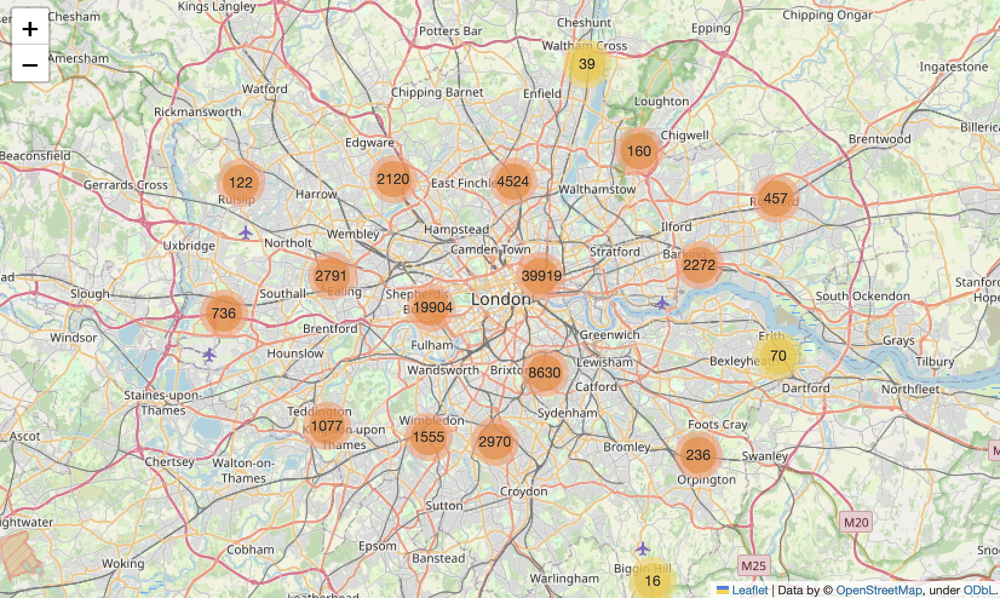

In [ ]:
# create a similar heatmap
folium.plugins.HeatMap(subset_listings_ldn[["latitude","longitude"]], radius_value=50).add_to(map)
map

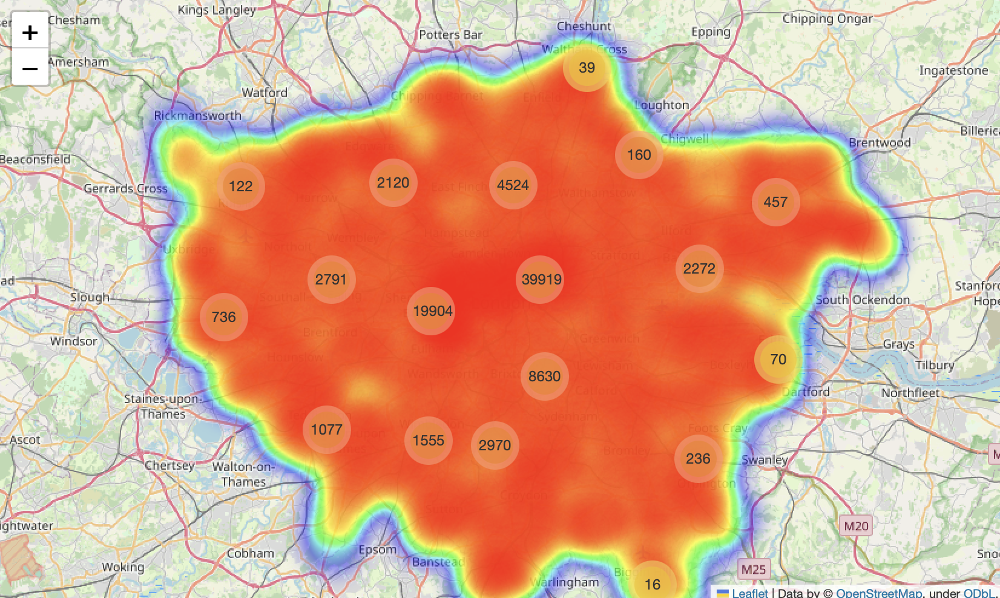

In [ ]:
# creates a map with locations of listings and house prices
airbnb_merged = gpd.GeoDataFrame(airbnb_merged, geometry='geometry')
airbnb_merged.explore(column='Value', cmap='Blues', scheme='Quantiles', k=5)

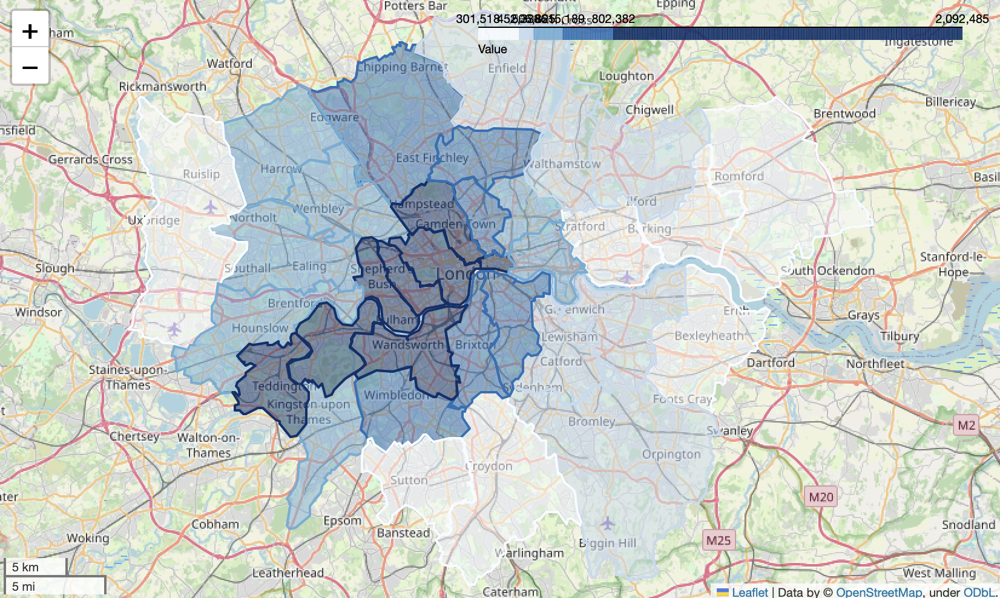

### 4 Bivariate analysis: Airbnb and house prices

Finally, we explore the relationships between number of Airbnb listings, their prices and average house prices by presenting a correlation matrix and a pairplot with univariate distributions and scatter plots. 

As shown below in the correlation matrix, there are very strong positive correlations between our variables. The scatterplots in the pairplot figure similarly suggest a very strong positive relationship.

Before concluding, however, it is important to note that these are only correlational results. It is very likely the case that there are factors affecting both high density of Airbnbs and high house prices; for example, higher wages, more economic activity, attractiveness of these locations, tourism etc. To explore the relationship between the density of Airbnb and house prices more rigorously, we would have to rely at the very on regression analysis to account for these unobserved factors.

In [45]:
import seaborn as sns

<Axes: >

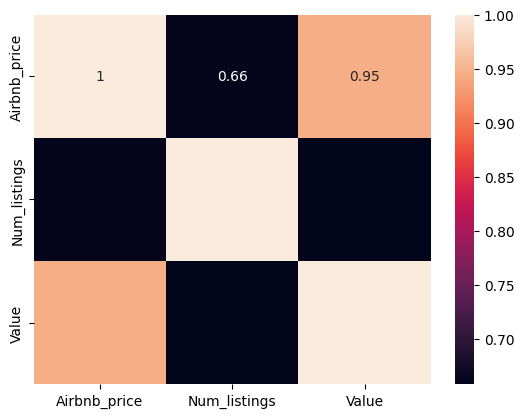

In [46]:
# explore correlations between numerical variables 
num_cols = ['Airbnb_price', 'Num_listings', 'Value']

# correlation matrix
corr_mat = airbnb_merged[num_cols].corr()

# create a heatmap of correlations
sns.heatmap(corr_mat, annot=True)

/Users/ninabucekova/miniconda3/envs/ua/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/ninabucekova/miniconda3/envs/ua/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/ninabucekova/miniconda3/envs/ua/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


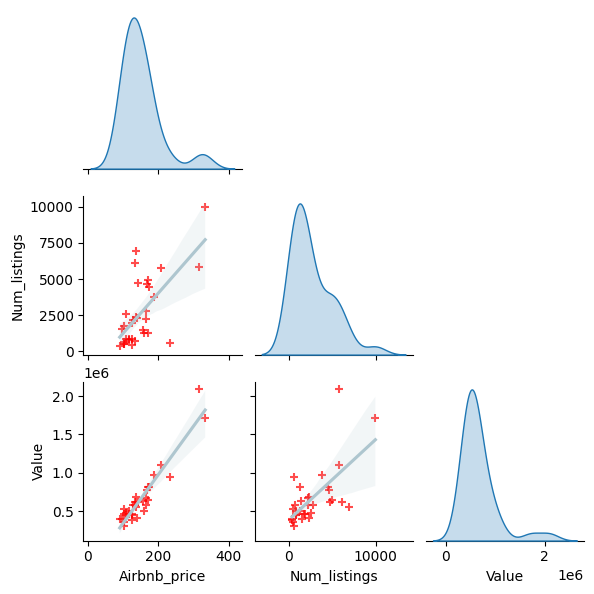

In [47]:
# create a pairplot
sns.pairplot(airbnb_merged[num_cols],
             markers="+",
             diag_kind="kde",
             kind='reg',
             plot_kws={'line_kws':{"color":"#aec6cf"},
                      'scatter_kws':{'alpha': 0.7,
                                    'color': 'red'}},
             corner=True,
             height=2)

## Challenge 3

### 1 Import and clean data
In the first step, we import the dataset on Motor Vehicle Collisions in New York using API endpoint. This, however, requires obtain an authenification token first, as the full data is readilt available for security reasons.

Subsequently, we clean data, remove missing values and convert to a geopandas dataframe to prepare it for mapping.

In [48]:
pip install sodapy

Note: you may need to restart the kernel to use updated packages.


In [49]:
import requests
import lonboard
from sodapy import Socrata

In [50]:
import geopandas as gpd
import palettable.colorbrewer.diverging
from lonboard import Map, PathLayer
from lonboard.colormap import apply_continuous_cmap

In [51]:
# get the URL
url_crashes = "https://data.cityofnewyork.us/resource/h9gi-nx95.json"
params = {
    "$$app_token": "TIOthhwDG7D5S5Bu1030C6O8t",
    "$limit": 1000000
}

# Send initial request to get the first batch of records
response = requests.get(url_crashes, params=params)
response

<Response [200]>

In [52]:
import pandas as pd
data = response.json()
crashes_df = pd.DataFrame(data)
crashes_df.head()

,crash_date,crash_time,on_street_name,off_street_name,number_of_persons_injured,number_of_persons_killed,number_of_pedestrians_injured,number_of_pedestrians_killed,number_of_cyclist_injured,number_of_cyclist_killed,...,latitude,longitude,location,cross_street_name,contributing_factor_vehicle_3,vehicle_type_code_3,contributing_factor_vehicle_4,vehicle_type_code_4,contributing_factor_vehicle_5,vehicle_type_code_5
0,2021-09-11T00:00:00.000,2:39,WHITESTONE EXPRESSWAY,20 AVENUE,2,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2022-03-26T00:00:00.000,11:45,QUEENSBORO BRIDGE UPPER,NaN,1,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2022-06-29T00:00:00.000,6:55,THROGS NECK BRIDGE,NaN,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2021-09-11T00:00:00.000,9:35,NaN,NaN,0,0,0,0,0,0,...,40.667202,-73.8665,"{'latitude': '40.667202', 'longitude': '-73.86...",1211 LORING AVENUE,NaN,NaN,NaN,NaN,NaN,NaN
4,2021-12-14T00:00:00.000,8:13,SARATOGA AVENUE,DECATUR STREET,0,0,0,0,0,0,...,40.683304,-73.917274,"{'latitude': '40.683304', 'longitude': '-73.91...",NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [53]:
crashes_df.shape

(1000000, 29)

In [54]:
# Check for missing values
# count missing values in the geometry columns
nan_lat = crashes_df['latitude'].isna().sum()
nan_long = crashes_df['longitude'].isna().sum()
print(nan_lat,nan_long)

# drop the missing values
crashes_df = crashes_df.dropna(subset=['latitude', 'longitude'])

72166 72166


In [55]:
# convert columns of interest into float
col_to_float = [ 'latitude', 'longitude', 
                'number_of_persons_injured', 'number_of_persons_killed', 
                'number_of_cyclist_injured', 'number_of_cyclist_killed']

crashes_df[col_to_float].astype(float)

,latitude,longitude,number_of_persons_injured,number_of_persons_killed,number_of_cyclist_injured,number_of_cyclist_killed
3,40.667202,-73.866500,0.0,0.0,0.0,0.0
4,40.683304,-73.917274,0.0,0.0,0.0,0.0
6,40.709183,-73.956825,0.0,0.0,0.0,0.0
7,40.868160,-73.831480,2.0,0.0,0.0,0.0
8,40.671720,-73.897100,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...
999995,40.704494,-73.817430,0.0,0.0,0.0,0.0
999996,40.840190,-73.943070,0.0,0.0,0.0,0.0
999997,40.609700,-74.024790,0.0,0.0,0.0,0.0
999998,40.614330,-73.997536,0.0,0.0,0.0,0.0


In [56]:
# convert into a Geodataframe
import geopandas as gpd
crashes_gdf = gpd.GeoDataFrame(crashes_df, 
                                   geometry=gpd.points_from_xy(crashes_df['longitude'], 
                                                               crashes_df['latitude']),
                                   crs = 'EPSG:4326')
crashes_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 927834 entries, 3 to 999999
Data columns (total 30 columns):
 #   Column                         Non-Null Count   Dtype   
---  ------                         --------------   -----   
 0   crash_date                     927834 non-null  object  
 1   crash_time                     927834 non-null  object  
 2   on_street_name                 690079 non-null  object  
 3   off_street_name                443213 non-null  object  
 4   number_of_persons_injured      927819 non-null  object  
 5   number_of_persons_killed       927807 non-null  object  
 6   number_of_pedestrians_injured  927834 non-null  object  
 7   number_of_pedestrians_killed   927834 non-null  object  
 8   number_of_cyclist_injured      927834 non-null  object  
 9   number_of_cyclist_killed       927834 non-null  object  
 10  number_of_motorist_injured     927834 non-null  object  
 11  number_of_motorist_killed      927834 non-null  object  
 12  contributing_

### 2 Vizualize data using the Lonboard library

In the second step, we utilize the Lonboard library to visualize our data. Though in following steps we will focus on number of persons injured and killed in the crashes, mapping locations of crashes based number of injuries and fatalities using available tools proves challenging. As we will see below, the distribution of number of injuries, death per accident is highly skewed - in vast majority of accidents, there were no death or injuries. This makes visualization of these variables challenging in two ways:

1. The tool we want to use - the lonboard library allows us to visualize point locations. Since there are very few accident locations with more deaths/injuries, these would not be very well visible.

2. Continuous or categorical variable? Visualizing it as a continuous variable is not suitable in this case considering visualization technique to be used. If we decided the recode it as a categorical variable, the choice of classes would be challenging due to its highly skewed distribution.

Therefore, we decide to visualize categorical variable readily available in the dataset - borough.

First, we use the default viz() tool to vizualize locations of these crashes and then we customize the layer to visualize boroughs.

In [ ]:
from lonboard import viz
viz(crashes_gdf)

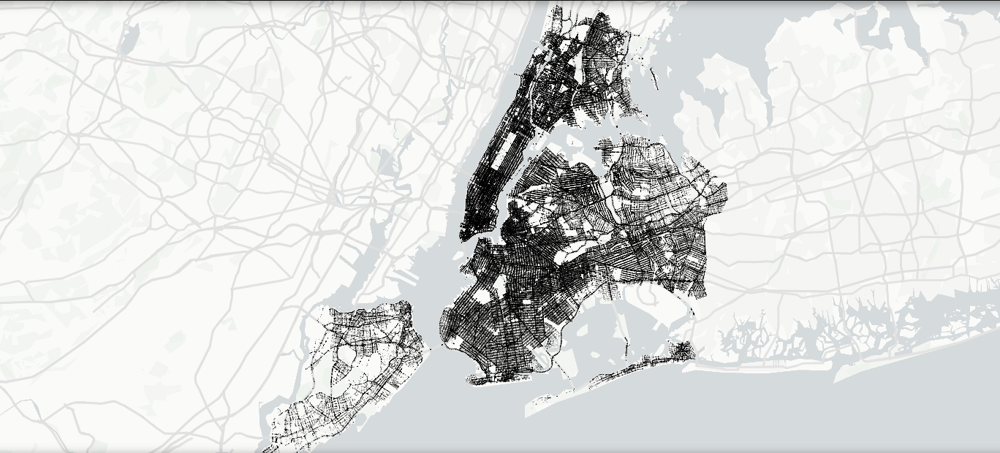

In [ ]:
from lonboard import Map, ScatterplotLayer

layer = ScatterplotLayer.from_geopandas(crashes_gdf)
map = Map(layers=[layer], _height=50)
map

In [60]:
# Choose a color palette to map different boroughs
import seaborn as sns

# Get unique categories
borough = crashes_gdf['borough'].unique()

# colour seaborn's "tab10" color palette
colors_borough = sns.color_palette("pastel", len(borough))

# We create a dictionary to map categories to colours
borough_dict = dict(zip(borough, colors_borough))

In [61]:
import numpy as np
color_array = np.array([tuple(np.append(
    np.multiply(
        borough_dict.get(x, (0, 0, 0)), 255).astype(int), 255)) 
                        for x in crashes_gdf['borough']],
                       dtype=np.uint8)
color_array

array([[161, 201, 244, 255],
       [161, 201, 244, 255],
       [255, 180, 130, 255],
       ...,
       [255, 180, 130, 255],
       [161, 201, 244, 255],
       [255, 159, 155, 255]], dtype=uint8)

In [62]:
layer.radius_scale = 10
layer.opacity = 0.10
layer.get_fill_color = color_array

### 3 Descriptive Statistics

In the next step, we conduct a simple exploratory data analysis of some key variables of interest. We focus on number of persons injured, killed and number of cyclist killed. This then can give us some insights about injury and fatality rates.

In [65]:
# generate summary statistics
cols = ['number_of_persons_killed', 'number_of_persons_injured', 
        'number_of_cyclist_killed', 'number_of_cyclist_injured']
crashes_gdf = crashes_gdf[cols].astype(float)

summary_stats = crashes_gdf[cols].describe()
summary_stats

,number_of_persons_killed,number_of_persons_injured,number_of_cyclist_killed,number_of_cyclist_injured
count,927807.000000,927819.000000,927834.000000,927834.000000
mean,0.001462,0.320935,0.000123,0.029440
std,0.040662,0.698477,0.011181,0.171271
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000
max,8.000000,27.000000,2.000000,3.000000


In [66]:
# frequency distribution of number of people killed/injured in crashes
number_injured = crashes_gdf['number_of_persons_injured'].value_counts()
number_killed = crashes_gdf['number_of_persons_killed'].value_counts()

print(number_killed)
print(number_injured)

number_of_persons_killed
0.0    926508
1.0      1258
2.0        32
3.0         6
4.0         2
8.0         1
Name: count, dtype: int64
number_of_persons_injured
0.0     706453
1.0     172403
2.0      32404
3.0      10307
4.0       3815
5.0       1430
6.0        540
7.0        231
8.0        101
9.0         39
10.0        32
11.0        16
12.0        11
13.0        10
15.0         6
14.0         5
17.0         4
16.0         4
18.0         3
20.0         2
22.0         1
19.0         1
27.0         1
Name: count, dtype: int64


### 4 Bivariate and univariate analysis

Finally, we conduct some simple univariate and bivariate analysis to explore the relationships between our variables of interest.

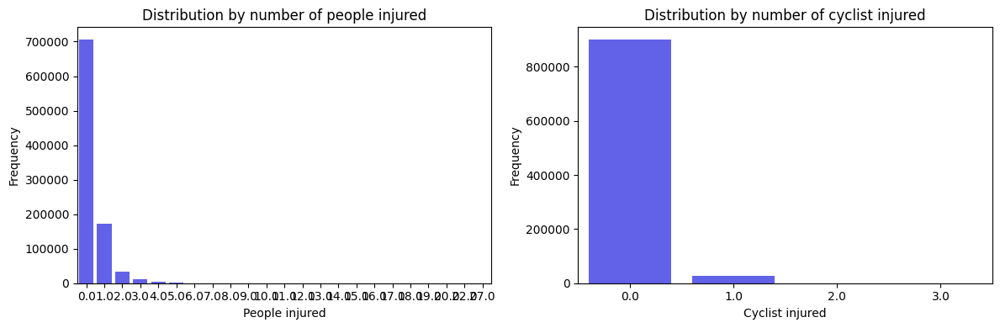

In [67]:
import matplotlib.pyplot as plt

# Visualize in histogram: by number of persons and cyclist injured
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Plot histogram 1
sns.countplot(data=crashes_gdf, x='number_of_persons_injured', color='blue', alpha=0.7, ax=axes[0])
axes[0].set_title('Distribution by number of people injured')
axes[0].set_xlabel('People injured')
axes[0].set_ylabel('Frequency')

# Plot histogram 2
axes[1].ticklabel_format(style='plain', axis='both')
sns.countplot(data=crashes_gdf, x='number_of_cyclist_injured', color='blue', alpha=0.7, ax=axes[1])
axes[1].set_title('Distribution by number of cyclist injured')
axes[1].set_xlabel('Cyclist injured')
axes[1].set_ylabel('Frequency')

# Adjust layout to prevent overlapping
plt.tight_layout()

# Show the plots
plt.show()

<Axes: >

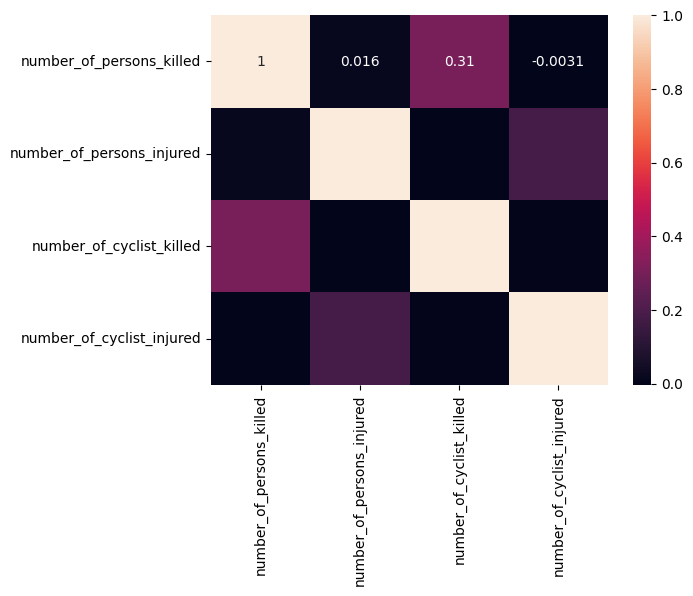

In [68]:
# Calculate and visualize correlations
corr = crashes_gdf[cols].corr()

# create a heatmap of correlations
sns.heatmap(corr, annot=True)

## Challenge 4

### 1 Differences between Lonboard and Datashader 
(1) Lonboard 
- allows using data in traditional formats such as CSV or JSON which are however, very memory intensive, this becomes especially of a problem when dealing with very large datasets,
- work with data in vector form which is slow and unsuitable for the very largest datasets.

(2) Datashader
- uses GeoPaquet files are more suitable for working with large spatial datasets as they can be read much more quickly and efficiently,
- instead of working with data in vector form, it transforms them into a plot using a 5-step pipeline: projection, transformation, aggregation, colormapping and embedding.

### 2 Explore a large dataset: US Census 2010

In the second section of challenge 4, we import, explore and visualize a large dataset using Datashader and related tools. We will work with the US Census 2010 data available from https://s3.amazonaws.com/datashader-data/census2010.parq.zip. This dataset includes more than 300 millions observations representing individuals at their approximate location and their race. We use this unique dataset to explore population density and racial makeup of the US population on the individual level and visualize it. 

The biggest challenge was to find and download a dataset in parquet format. Since this data format and libraries for handling such data are relatively new, to date, there are relatively limited options of data sources. But once we downloaded the data, the datashader library allowed for fast and effective manipulation and visualization of this very large dataset.

#### 2.1 Set up and import data
In the first step, we import all necessary libraries and the dataset. As the dataset is available as a zip file, we first need to unzip. Then we can explore its structure.

In [69]:
pip install fastparquet

Note: you may need to restart the kernel to use updated packages.


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
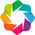

In [4]:
import holoviews as hv, pandas as pd, colorcet as cc
from holoviews.element.tiles import EsriImagery
from holoviews.operation.datashader import datashade
hv.extension('bokeh')

import datashader as ds 
import datashader.transfer_functions as tf
import numpy as np
import dask.dataframe as dd
import requests

In [5]:
import zipfile
import os

# open zipfile
with zipfile.ZipFile('Lab3_Data/census2010.parq.zip', 'r') as zip_ref:
    zip_ref.extractall('census2010')

In [6]:
df = pd.read_parquet(
    'census2010/census2010.parq', engine = 'fastparquet')

In [7]:
df.head()

,easting,northing,race
0,-12418767.0,3697425.00,h
1,-12418512.0,3697143.50,h
2,-12418245.0,3697584.50,h
3,-12417703.0,3697636.75,w
4,-12418120.0,3697129.25,h


In [8]:
len(df)

306675004

#### 2.2 Population Density

In the following section, we create visualizations of population density in the US using hvplot from the datashader library.

In [ ]:
import hvplot.pandas

# Define background layer
map_tiles = EsriImagery().opts(alpha=0.5, width=900, height=480, bgcolor='black')

# Use hvplot to create a layer visualizing population density
plot = df.hvplot(
    'easting',
    'northing',
    kind='scatter',
    rasterize=True,
    cmap=cc.fire,
    cnorm='eq_hist'
)
map_tiles * plot

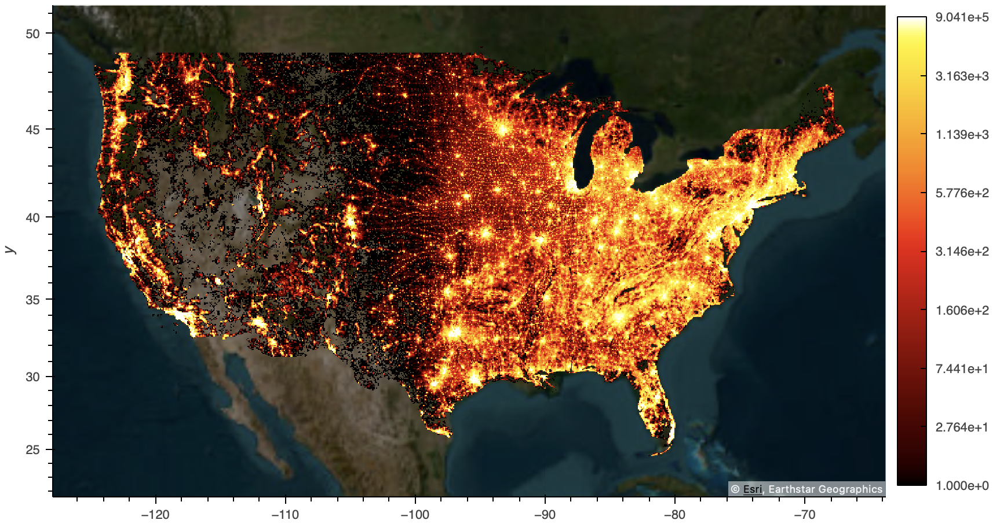

#### 2.3 Racial composition of the US population

Apart from the information on location which allows us to visualize population density, this dataset includes one other variable - race. To explore the geography of racial composition of the US population, we simplify and modify the code used by in https://examples.holoviz.org/gallery/census/census.html#population-density.

After importing utility functions above, we define geographic ranges, plot size and background which we will use to then create visualizations.

In [10]:
# Define colors identifying different values of categorical variable race
color_key = {'w':'white', 'b':'yellow',  'a':'lime', 'h':'red', 'o':'blue'}

In [ ]:
# Create a map of racial composition of the US
cvs = ds.Canvas(plot_width=900, plot_height=480)
points = cvs.points(df, 'easting', 'northing', ds.count_cat('race'))
img_race = tf.shade(points, color_key=color_key, how='eq_hist')
img_race

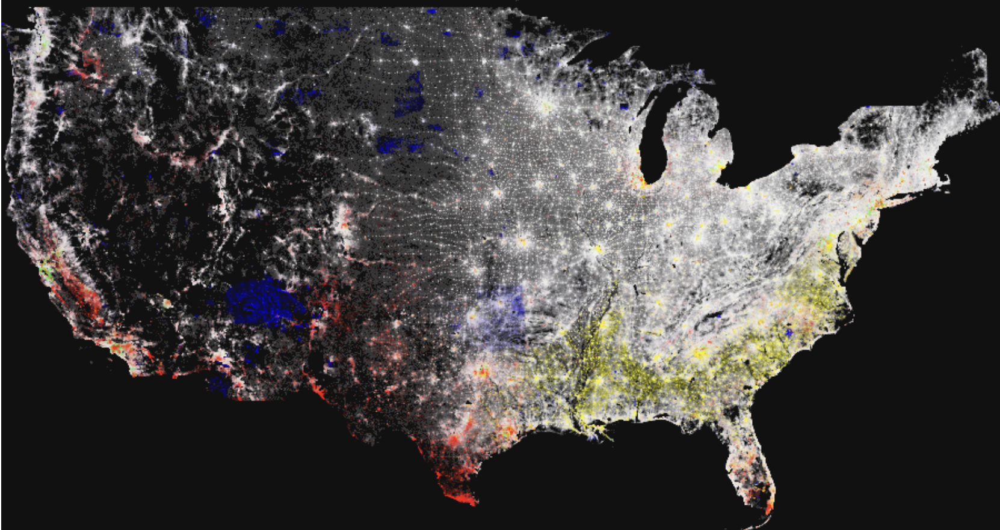

The map above shows the US population ny race. White represents white population, yellow color black population, red color the Hispanics, green Asian population and blue other racial groups.

As we can see above, the US population is largely white. However, we can observe a higher concentration of black population in south-east and of Hispanics near the Mexican border. Higher concentration of other racial groups is observable in some areas of mid-west. These are likely indigenous populations.